# Detecting Cancer in Gigapixel Medical Images

## Final Project for Applied Deep Learning (Fall 2018) by Aleksandra 'Ola' Hosa


### YouTube [demo](https://youtu.be/OL3j-ZDUQB8). GitHub [repo](https://github.com/olahosa/adl_cancer_detection).


* Source of medical slides and tumor masks: [CAMELYON16](https://camelyon17.grand-challenge.org/Data/) dataset. 

* You can find a folder of 22 slides and tumor masks prepared by Joshua Gordon [here](https://drive.google.com/drive/folders/1rwWL8zU9v0M27BtQKI52bF6bVLW82RL5?usp=sharing).

* To run this code, first you will need to install [OpenSlide](https://openslide.org/), the only non-Python dependency (can be installed in Colab)

### Intro

In this project I follow the methodology of [Lui et al. (2017)](https://arxiv.org/abs/1703.02442) in "Detecting Cancer Metastases on Gigapixel Pathology Images". I train a neural network with a convolutional base on patches extracted from the medical slides. The classifier is then used on unseen images to detect the presence of tumors and produce heatmaps. This notebook contains a verions of the model with a **multi** zoom level input. This implementation allows for a choice of:
- 2 magnification (zoom) levels for the model: an integer between 0 and 7 (athough greater than 4 not recommended)
- sizes of the patch and of the centre of the model
- pre-processing method (rescaling to [0, 1] or to [-1, 1])
- type of convolutional base: Inception or a base defined by me (takes less time to train)


### Notebook Overview

1. Set-up: choose model configuration (zoom levels etc.)
2. Import necessary packages
3. Collect train/val and test patches
4. Post-process extracted patches
5. Model definition
6. Model execution
7. Model evaluation
8. Heatmap generation



### Practical considerations
- this version of the model was run on Google Cloud compute instance with 16CP, 60GB and with 1 GPU mounted
- Jupyer notebook on GC was set up following instructions from [here](https://towardsdatascience.com/running-jupyter-notebook-in-google-cloud-platform-in-15-min-61e16da34d52)
- all libraries were installed in the terminal
- careful to install OpenSlide library version: 3.4.1 (I have experienced different behavior in reading images from previous versions)
- images copied for local machine using gcloud scp utility
- to keep it consistent with the singl elevel models ran on COlab, copy only a subset (11) or all slides provided by Joshua Gordon (22) - becasue of storage memory constraints on Colab

The notebook is running end-to-end in a jupyter notebook on GCP after installing necessary packages and downloading the slides.

# Set-up

In [1]:
# set levels: 0 to 7 (greater than 4 not recommended)
lev1 = 0
lev2 = 1

# set patch sizes (I don't recomment changing that, although making it smaller 
# will decrease run time)
patch_size = 299
patch_centre = 128

# choose pre-processing: 'rescale_0-1' or 'rescale_-1-1'
my_pre_process = 'rescale_0-1'

# choose conv base: 'Inception' or 'my-conv-base'
my_conv_base = 'my-conv-base'

model_name = 'multi-input_' + my_conv_base + '_lev' + str(lev1) + str(lev2)
print(model_name)

multi-input_my-conv-base_lev01


# Import packages

Proper OpenSlide libraries installed in the terminal

In [2]:
from openslide import open_slide, __library_version__ as openslide_lib_version, __version__ as openslide_version

import numpy as np
import random, os, glob, time

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.colors import Normalize

from PIL import Image

from keras.preprocessing.image import array_to_img, ImageDataGenerator
from keras.layers import Dense, concatenate, Flatten, Dropout, Conv2D, BatchNormalization, Activation, MaxPooling2D
from keras.models import Model, load_model, Sequential
from keras.applications.inception_v3 import InceptionV3
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping, ModelCheckpoint

from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score, recall_score, precision_score

Using TensorFlow backend.


In [3]:
print('openslide version:', openslide_version)
print('openslide library version:', openslide_lib_version)
!python --version

openslide version: 1.1.1
openslide library version: 3.4.1
Python 3.6.7


# Slides

Slides downloaded to GC instance from local machine using gcloud utilities.

In [4]:
# check if slides are there
!ls -hlt slides

total 15G
-rw-r--r-- 1 olahosa olahosa  42M Dec 11 09:06 tumor_096_mask.tif
-rw-r--r-- 1 olahosa olahosa 1.3G Dec 11 09:05 tumor_096.tif
-rw-r--r-- 1 olahosa olahosa  52M Dec 11 08:58 tumor_094_mask.tif
-rw-r--r-- 1 olahosa olahosa 1.5G Dec 11 08:58 tumor_094.tif
-rw-r--r-- 1 olahosa olahosa  15M Dec 11 08:49 tumor_091_mask.tif
-rw-r--r-- 1 olahosa olahosa 522M Dec 11 08:49 tumor_091.tif
-rw-r--r-- 1 olahosa olahosa  25M Dec 11 08:46 tumor_084_mask.tif
-rw-r--r-- 1 olahosa olahosa 800M Dec 11 08:45 tumor_084.tif
-rw-r--r-- 1 olahosa olahosa  50M Dec 11 08:34 tumor_078_mask.tif
-rw-r--r-- 1 olahosa olahosa 1.6G Dec 11 08:34 tumor_078.tif
-rw-r--r-- 1 olahosa olahosa  32M Dec 11 08:24 tumor_075_mask.tif
-rw-r--r-- 1 olahosa olahosa 894M Dec 11 08:24 tumor_075.tif
-rw-r--r-- 1 olahosa olahosa  95M Dec 11 08:19 tumor_064_mask.tif
-rw-r--r-- 1 olahosa olahosa 1.6G Dec 11 08:18 tumor_064.tif
-rw-r--r-- 1 olahosa olahosa  95M Dec 11 07:33 tumor_031_mask.tif
-rw-r--r-- 1 olahosa olahosa 1.4G D

# Collect train/val and test patches

In [5]:
# functions provided by Joshua Gordon

# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.

def read_slide(slide, x, y, level, width, height, as_float=False):
    """ Read a region from the slide
    Return a numpy RBG array
    """
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

def find_tissue_pixels(image, intensity=0.8):
    """ Return tissue pixels for an image
    """
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return zip(indices[0], indices[1])
  
def apply_mask(im, mask, color=(1,0,0)):
    """ Return the mask as an image
    """
    masked = np.zeros(im.shape)
    for x,y in mask: masked[x][y] = color
    return masked

In [6]:
def plot_patch_triplet(lev, patch_centre, patch_image, patch_mask, patch_tissue, figname, f_num):
    """ Plot a triplet of images for an extracted patch:
    a) RBG image of patch
    b) RBG image with tumor mask overlay and 128x128 center red square
    c) tissue mask with tumor mask overlay
    inputs:
    - lev: int, between 0 and 7
    - patch_centre: int, usually 128
    - patch_image: image of a patch
    - patch_mask: mask of tumor for that patch
    - patch_tissue: image of 
    - figname: str, file name for the figure
    - f_num: str, slide number
    outputs: none, figure plotted and saved
    """
    
    # get patch size
    patch_size = patch_image.shape[0]
    # get the offset for plotting the 128x128 red square
    offset = int((patch_size-patch_centre)/2)
    
    # calc tissue ratio in the patch to display in figure title
    tissue_ratio = np.sum(patch_tissue[:,:,0])/(patch_size**2)
    
    fig, axes = plt.subplots(1,3, figsize=(15,5))
    
    cmap = plt.cm.viridis

    # normalize the patch mack between 0 and 1
    v_min, v_max = 0, 1
    colors = Normalize(v_min, v_max)(patch_mask)
    colors = cmap(colors)
    # add transparency layer equal to the image: low values are translarent,
    # high values are more opaque
    colors[..., -1] = patch_mask
    
    # image a) patch in RGB
    a = axes[0]
    a.imshow(patch_image)
    a.set_title('Slide %s, level: %d' % (f_num, lev))
    a.grid(False)

    # image b) patch with tumor overlay (viridis) - cancer is yellow
    a = axes[1]
    a.imshow(patch_image)
    a.grid(False)
    a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.8)
    a.plot([offset, offset+patch_centre, offset+patch_centre, offset, offset],
                 [offset, offset, offset+patch_centre, offset+patch_centre, offset], 'r')
    a.set_title('Cancer is yellow: if in red square - label 1')

    # image c) tissue mask with tumor mask overlay
    a = axes[2]
    a.imshow(patch_tissue, cmap='plasma', vmin=0, vmax=1), axes[2].grid(False)
    a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.5)
    a.set_title('Tissue ratio: ' + str(round(tissue_ratio,2)))
    
    plt.show()
    fig.savefig(figname+'.pdf', bbox_inches='tight')

In [7]:
def get_patches(slide, tumor_mask, lev, x0, y0, patch_size):
    """ Get patches from a slide: RBG image, tumor mask, tissue mask CENTERED at x0, y0
    imputs:
    - slide: OpenSlide object for RGB slide images
    - tumor_mask: OpenSlide object for tumor masks
    - lev: int, target zoom level for the patches, between 0 and 7
    - x0, y0: int, pixel coordinates at level 0
    - patch_size: int, usually 299
    outputs:
    - patch_image: array, RBG image
    - patch_mask: array, tumor mask
    - patch_tissue: array, tissue mask
    """
    
    # calc downsample factor
    downsample_factor = 2**lev
    
    # calc new x and y so that the patch is CENTER at the input x and y
    new_x = x0-(patch_size//2)*downsample_factor
    new_y = y0-(patch_size//2)*downsample_factor
        
     # read RGB patch
    patch_image = read_slide(slide,
                             x = new_x,
                             y = new_y, 
                             level = lev,
                             width = patch_size,
                             height = patch_size)
    
    # read tumor mask
    patch_mask = read_slide(tumor_mask,
                            x = new_x,
                            y = new_y, 
                            level = lev,
                            width = patch_size,
                            height = patch_size)

    # 1 channel is enough for the mask
    patch_mask = patch_mask[:,:,0]
    
    # make tissue mask
    tissue_pixels = find_tissue_pixels(patch_image)
    patch_tissue = apply_mask(patch_image, tissue_pixels)
    
    return patch_image, patch_mask, patch_tissue

In [8]:
def check_patch_centre(patch_mask, patch_centre):
    """ Check if there is any tumor pixel in the 128x128 centre
    inputs:
    - patch_mask: array, tumor mask
    - patch_centre: int, usually 128
    outputs: Boolean
    """
    
    # get patch size
    patch_size = patch_mask.shape[0]
    
    # get the offset to check the 128x128 centre
    offset = int((patch_size-patch_centre)/2)
    
    # sum the pixels in the 128x128 centre for the tumor mask
    sum_cancers = np.sum(patch_mask[offset:offset+patch_centre, offset:offset+patch_centre])
    
    return sum_cancers>0

In [9]:
def collect_patches(img_list, lev1, lev2, num_per_img, patch_size, patch_centre):
    """ Extract patches with labels from the slides in the list
    inputs:
    - img_list: list of str, slide numbers to process
    - lev1: int, target zoom level for the patches, between 0 and 7 - higher resolution: lev1<lev2
    - lev2: int, target zoom level for the patches, between 0 and 7 - lower resolution
    - num_per_imgm: int, number of patches to extract per slide per class, usually 100
    - patch_size: int, usually 299
    - patch_centre: int, usually 128
    outputs:
    - patch_images: list, extracted patches as arrays
    - patch_labels: list, labels of patches: 0 - healthy, 1 - tumor
    - save a plot of the patches
    """

    # init output lists
    patch_images_lev1 = []
    patch_images_lev2 = []
    patch_labels = []

    for i, f_num in enumerate(img_list):

        num_cancer = 0
        num_health = 0

        # file paths
        slide_path = 'slides/tumor_'+f_num+'.tif'
        tumor_mask_path = 'slides/tumor_'+f_num+'_mask.tif'

        # get images with OpenSlide
        slide = open_slide(slide_path)
        tumor_mask = open_slide(tumor_mask_path)

        # read level 4 slide image and mask - for the purposes of getting healthy
        # and tumor pixels
        slide_image = read_slide(slide, 
                             x=0, 
                             y=0, 
                             level=4, 
                             width=slide.level_dimensions[4][0], 
                             height=slide.level_dimensions[4][1])

        mask_image = read_slide(tumor_mask, 
                            x=0, 
                            y=0, 
                            level=4, 
                            width=tumor_mask.level_dimensions[4][0], 
                            height=tumor_mask.level_dimensions[4][1])

        mask_image = mask_image[:,:,0]

        # get a list of tumor pixels at level 4
        mask_lev_4_cancer = np.nonzero(mask_image)

        # make a healthy tissue mask by subtracting tumor mask from tissue mask
        tissue_pixels = find_tissue_pixels(slide_image)
        tissue_regions = apply_mask(slide_image, tissue_pixels)

        mask_health = tissue_regions[:,:,0]-mask_image
        mask_health = mask_health>0
        mask_health = mask_health.astype('int')

        # get a list of healthy pixels at level 4
        mask_lev_4_health = np.nonzero(mask_health)

        print()
        print(f_num, len(mask_lev_4_cancer[0])//(patch_size**2), len(mask_lev_4_health[0])//(patch_size**2))
        
        # -------------------------------------------------------------
        # extract TUMOR patches

        # get a random sample of tumor pixels 
        # Note: did random.sample here rather than random.choice inside the while loop because os speed
        sample_cancer = random.sample(list(zip(mask_lev_4_cancer[1], mask_lev_4_cancer[0])), 500)

        c = 0

        # continue until enough patches extracted
        while num_cancer<num_per_img:
            c += 1
            if c%10==0:
                print(c, end=', ')

            # get the next pixel from the sample - coordinates at level 4
            (x4, y4) = sample_cancer[c]

            # convert level 4 coordinates to level 0
            x0 = x4*(2**4)
            y0 = y4*(2**4)
            
            # extract patches at lev1 CENTERED at that pixel
            patch_image_lev1, patch_mask_lev1, patch_tissue_lev1 = \
            get_patches(slide, tumor_mask, lev1, x0, y0, patch_size)

            # calc tissue ratio in that patch
            tissue_ratio = np.sum(patch_tissue_lev1[:,:,0])/(patch_size**2)

            # double-check if the patch has tumor
            has_cancer = check_patch_centre(patch_mask_lev1, patch_centre)

            # if it has more than 50% tissue and has tumor
            if (tissue_ratio>0.5) & has_cancer:

                # collect lev1 patch
                num_cancer += 1
                patch_images_lev1.append(patch_image_lev1)
                patch_labels.append(1)

                # extract a patch at lev2 (zoomed-out) ceneterd at the same pixel
                patch_image_lev2, patch_mask_lev2, patch_tissue_lev2 = \
                get_patches(slide, tumor_mask, lev2, x0, y0, patch_size)

                # collect lev2 patch
                patch_images_lev2.append(patch_image_lev2)

                # plot the last patches for both levels
                if len(patch_labels)%num_per_img==0:
                    figname = model_name+'_lev'+str(lev1)+'_patches_'+f_num+'_cancer-'+str(has_cancer)
                    plot_patch_triplet(lev1, patch_centre, patch_image_lev1, patch_mask_lev1, patch_tissue_lev1, figname, f_num)
                    figname = model_name+'_lev'+str(lev2)+'_patches_'+f_num+'_cancer-'+str(has_cancer)
                    plot_patch_triplet(lev2, patch_centre, patch_image_lev2, patch_mask_lev2, patch_tissue_lev2, figname, f_num)

        # -------------------------------------------------------------
        # extract HEALTHY patches
        # repeat the above for the healthy pixels
                    
        print()
        # get a random sample of healthy pixels 
        sample_health = random.sample(list(zip(mask_lev_4_health[1], mask_lev_4_health[0])), 500)

        c = 0

        # get healthy images
        while num_health<num_per_img:
            c += 1
            if c%10==0:
                print(c, end=', ')
                
            # get the next pixel from the sample - coordinates at level 4
            (x4, y4) = sample_health[c]

            # convert level 4 coordinates to level 0
            x0 = x4*(2**4)
            y0 = y4*(2**4)
            
            # extract patches at lev1 CENTERED at that pixel
            patch_image_lev1, patch_mask_lev1, patch_tissue_lev1 = \
            get_patches(slide, tumor_mask, lev1, x0, y0, patch_size)

            # calc tissue ratio in that patch
            tissue_ratio = np.sum(patch_tissue_lev1[:,:,0])/(patch_size**2)

            # check if the patch has tumor
            has_cancer = check_patch_centre(patch_mask_lev1, patch_centre)

            # if it has more than 50% tissue and doens't have tumor in the 128x128 centre
            if (tissue_ratio>0.5) & (not has_cancer):

                # collect lev1 patch
                num_health += 1
                patch_images_lev1.append(patch_image_lev1)
                patch_labels.append(0)

                # extract a patch at lev2 (zoomed-out) ceneterd at the same pixel
                patch_image_lev2, patch_mask_lev2, patch_tissue_lev2 = \
                get_patches(slide, tumor_mask, lev2, x0, y0, patch_size)

                # collect lev2 patch
                patch_images_lev2.append(patch_image_lev2)

                # plot the last patches for both levels
                if len(patch_labels)%num_per_img==0:
                    figname = model_name+'_lev'+str(lev1)+'_patches_'+f_num+'_cancer-'+str(has_cancer)
                    plot_patch_triplet(lev1, patch_centre, patch_image_lev1, patch_mask_lev1, patch_tissue_lev1, figname, f_num)
                    figname = model_name+'_lev'+str(lev2)+'_patches_'+f_num+'_cancer-'+str(has_cancer)
                    plot_patch_triplet(lev2, patch_centre, patch_image_lev2, patch_mask_lev2, patch_tissue_lev2, figname, f_num)

    return patch_images_lev1, patch_images_lev2, patch_labels


016 7 40
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

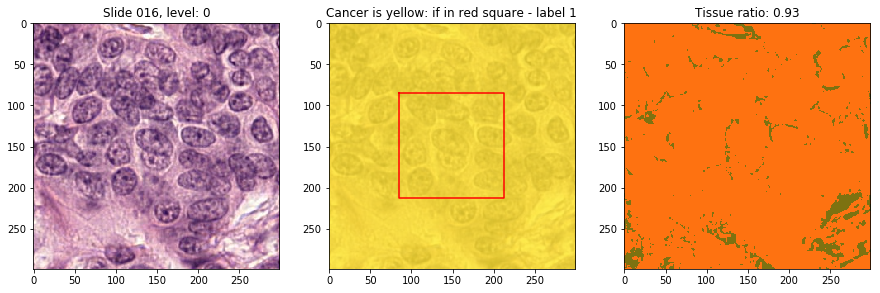

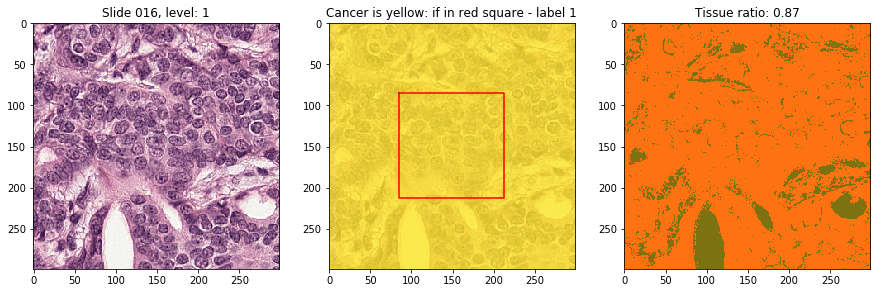


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 

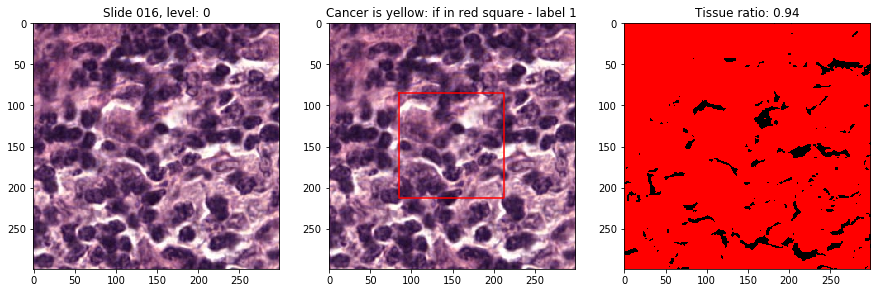

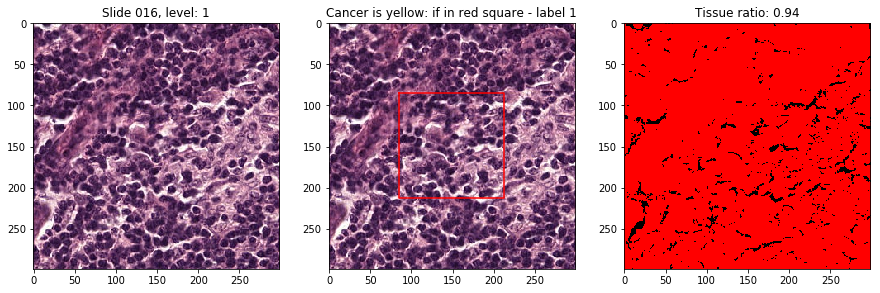


031 5 26
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

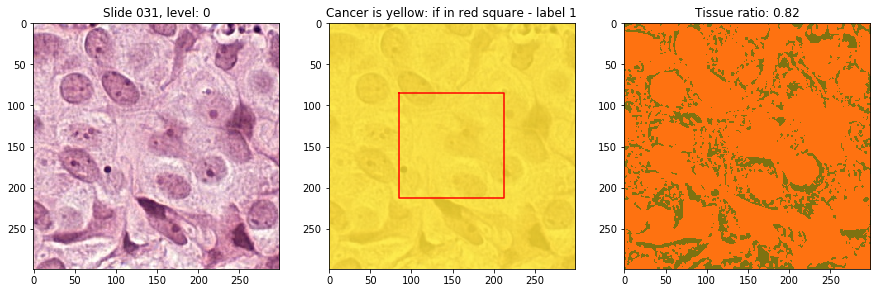

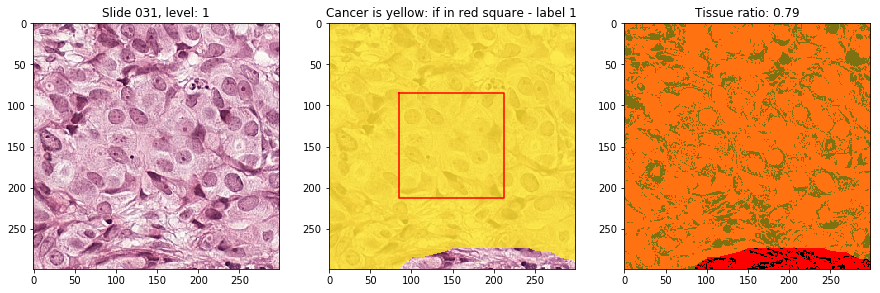


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 

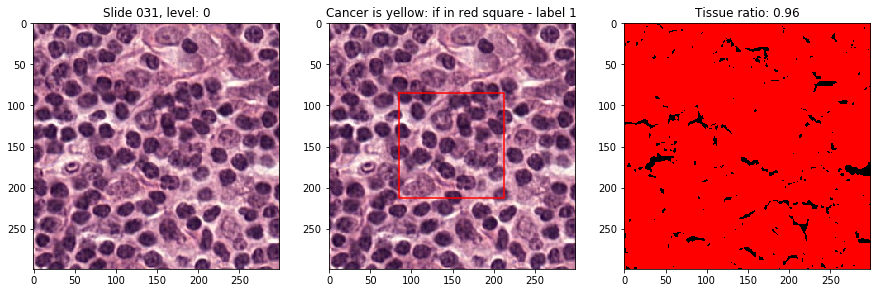

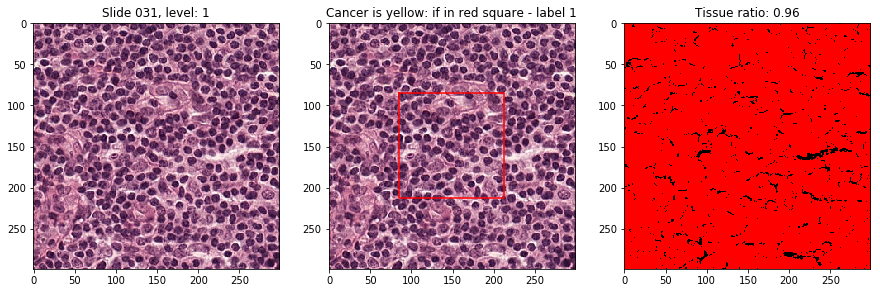


064 5 35
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 

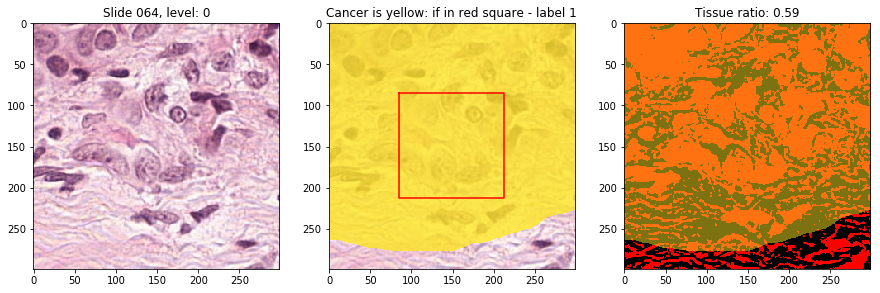

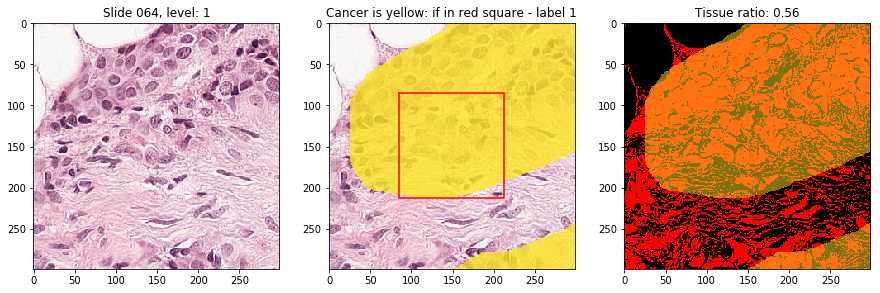


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 

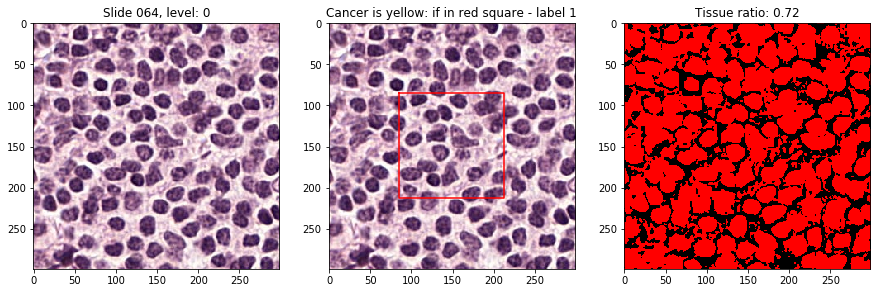

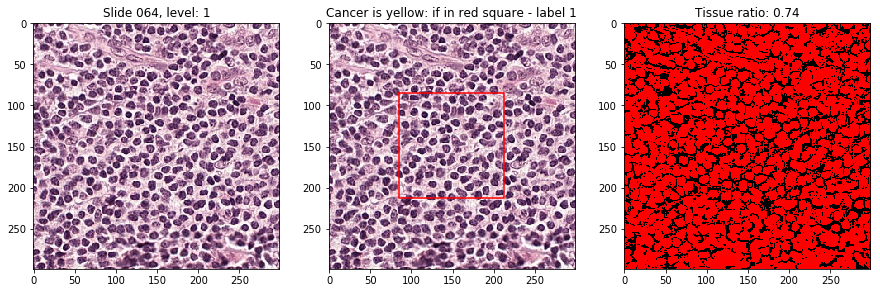


075 2 39
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 

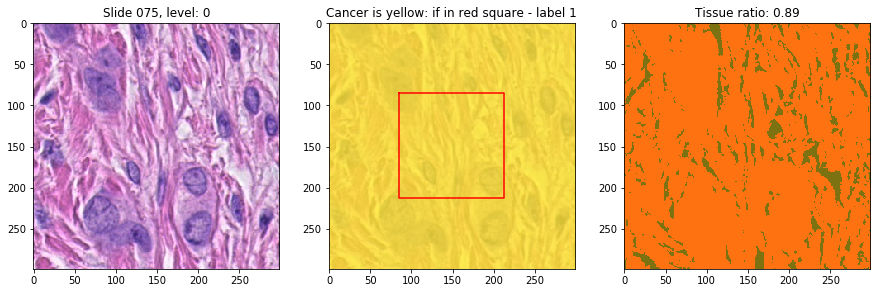

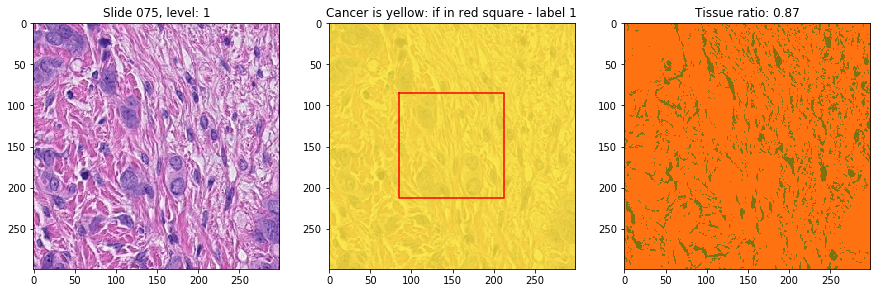


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 

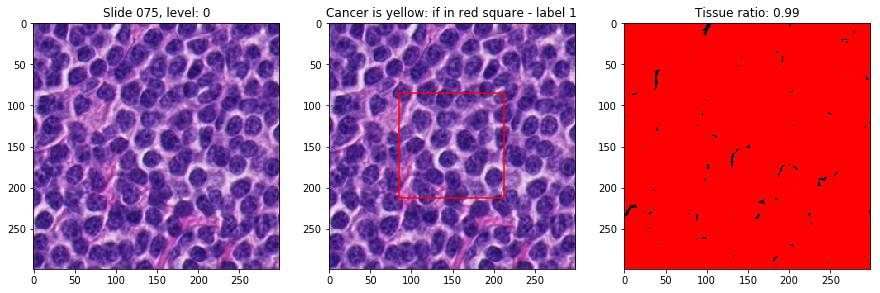

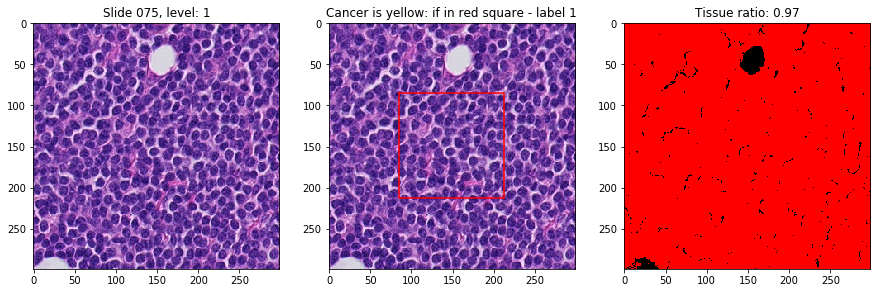


078 42 101
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

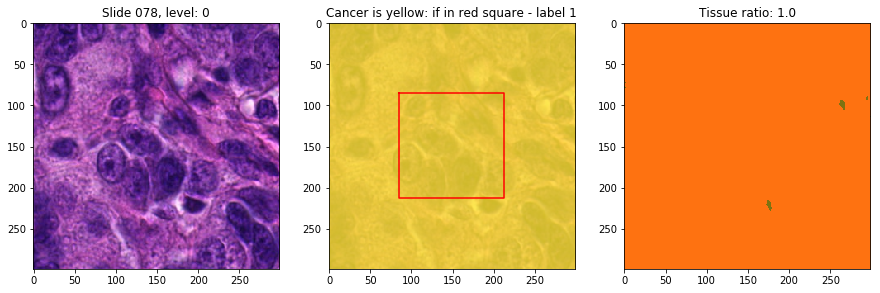

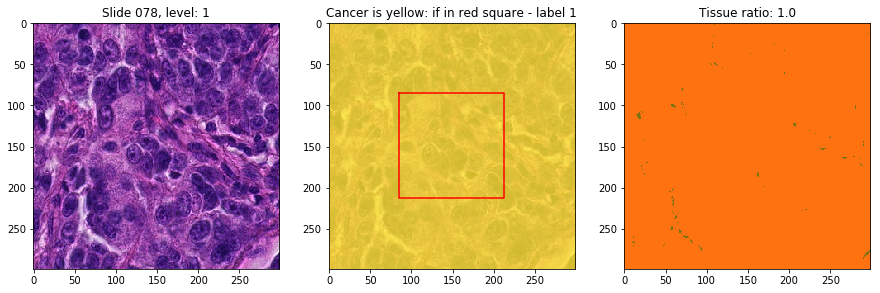


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 

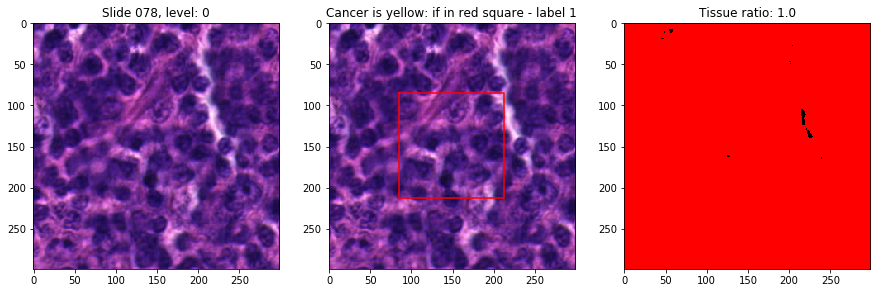

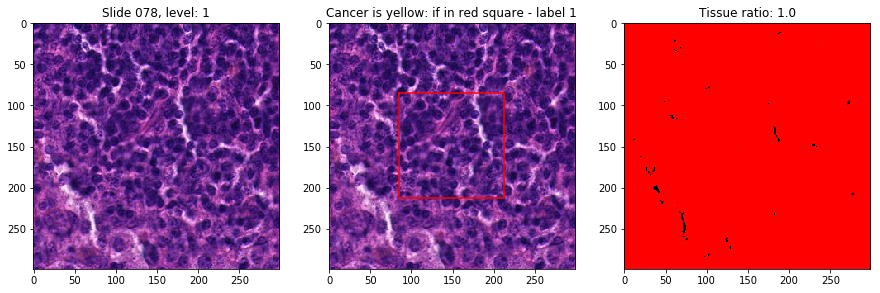


084 1 50
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

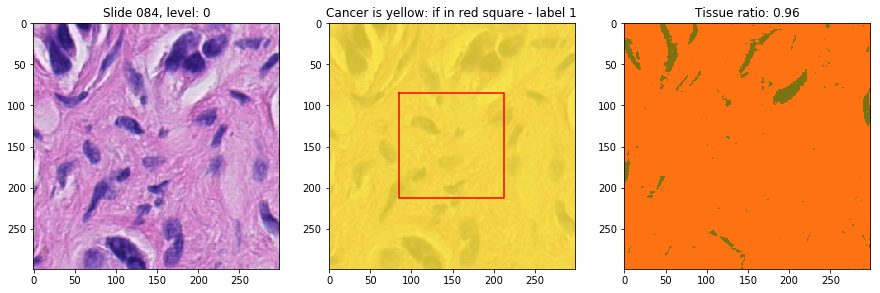

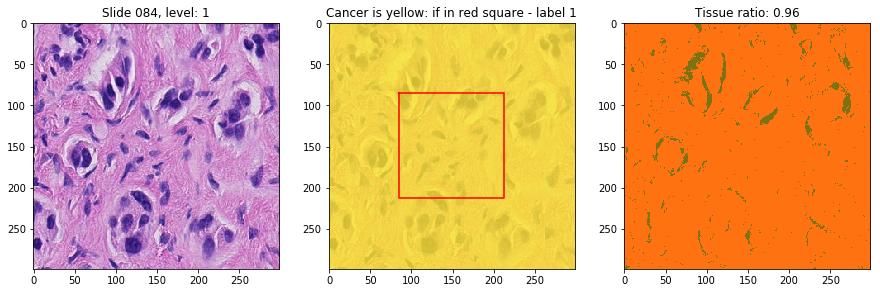


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 

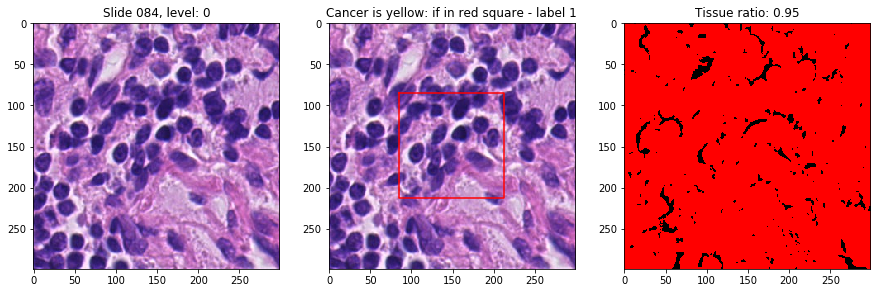

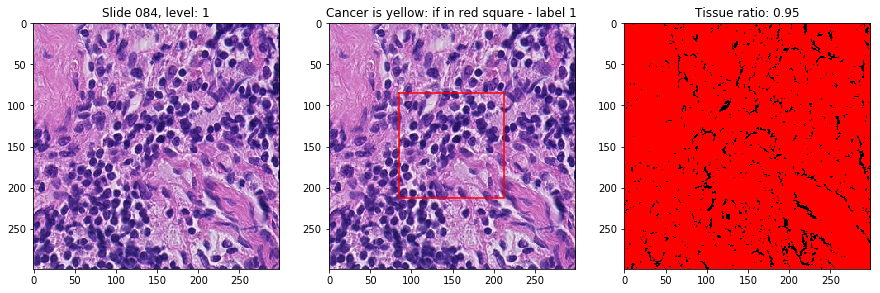


094 2 89
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

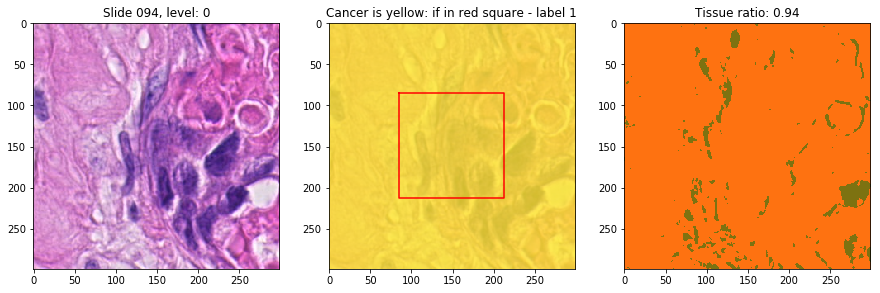

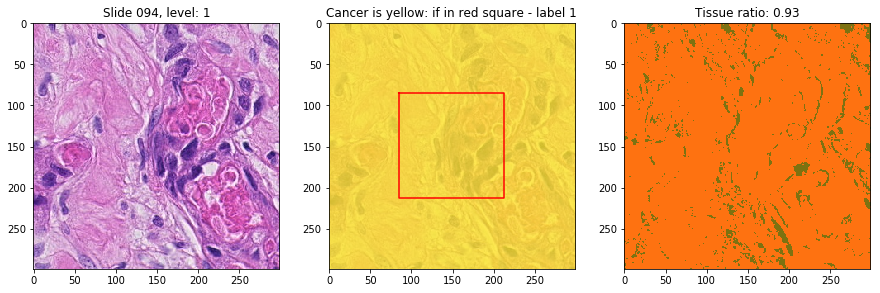


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 

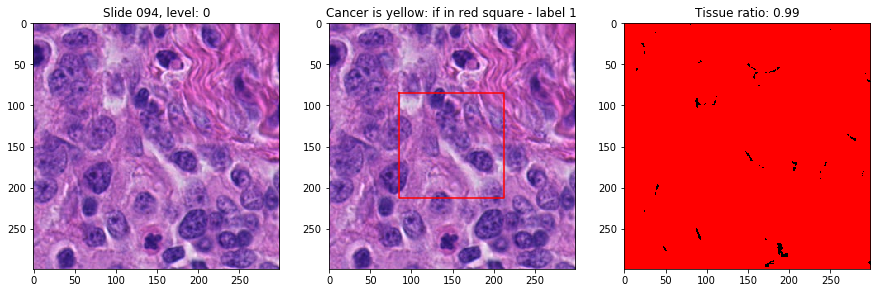

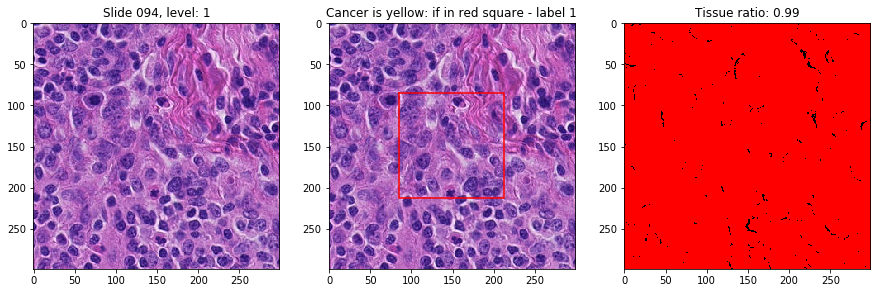


096 1 72
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

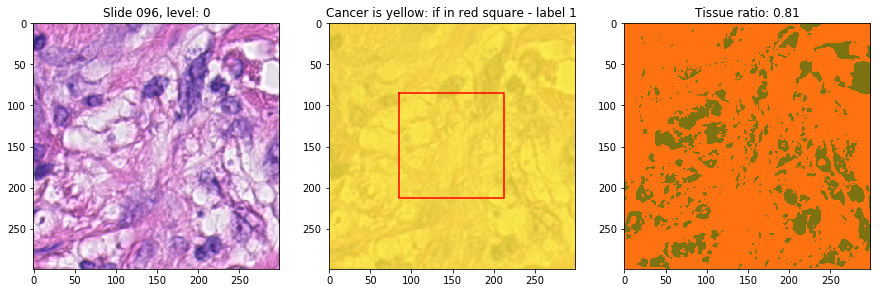

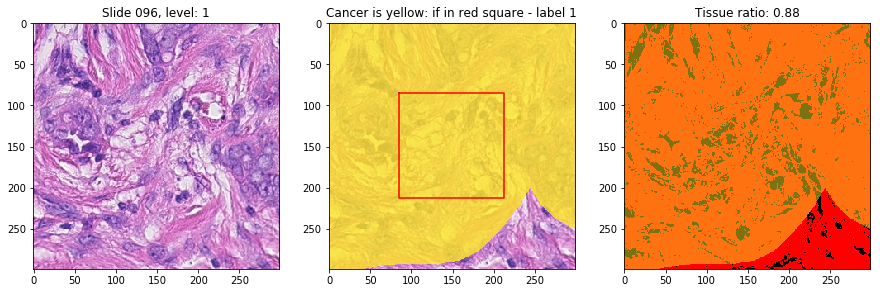


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 

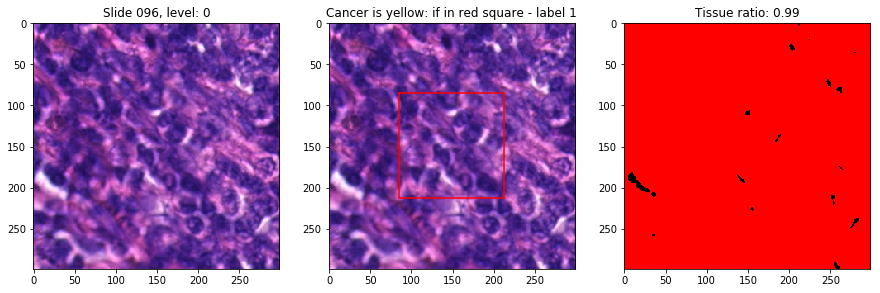

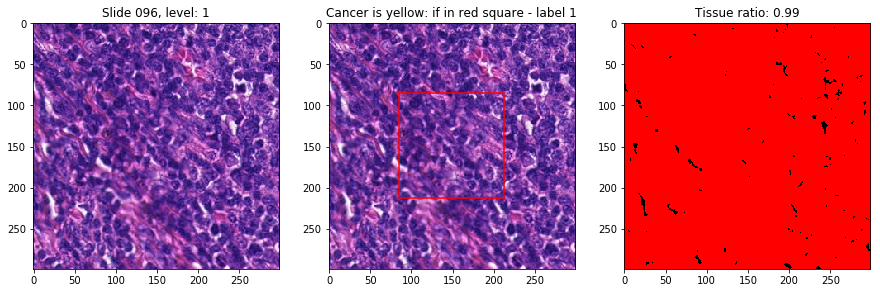


101 8 89
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

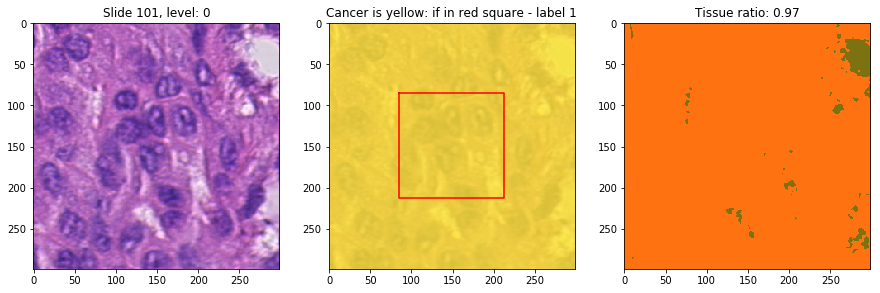

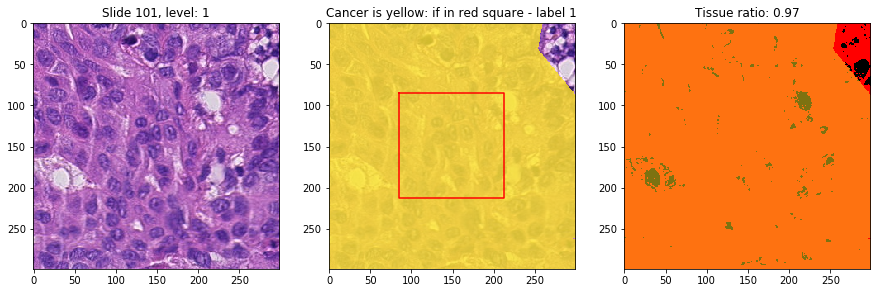


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

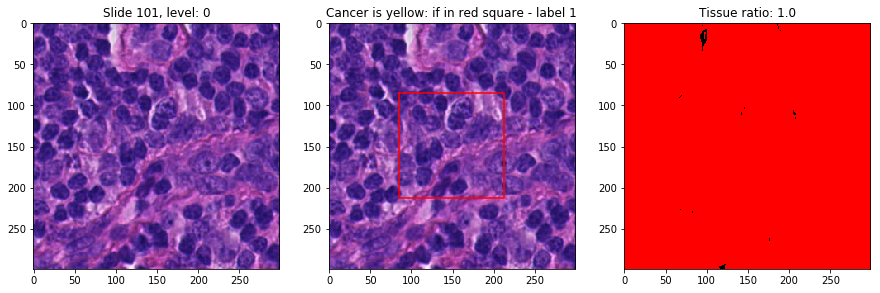

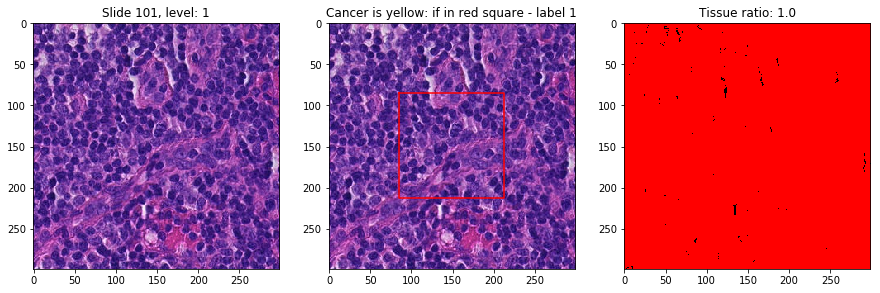


091 2 36
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

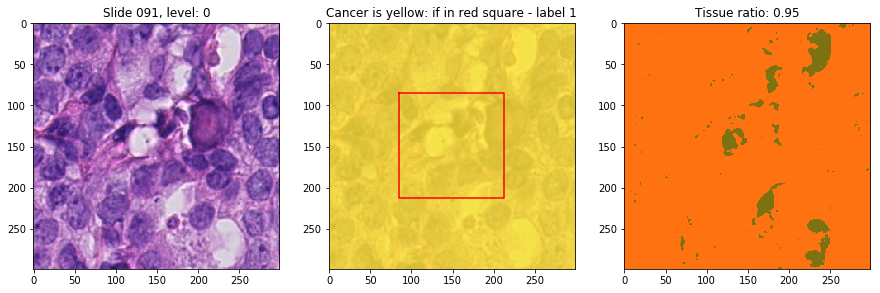

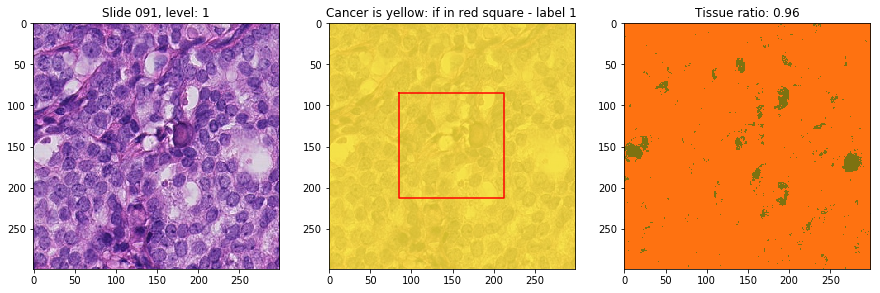


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 

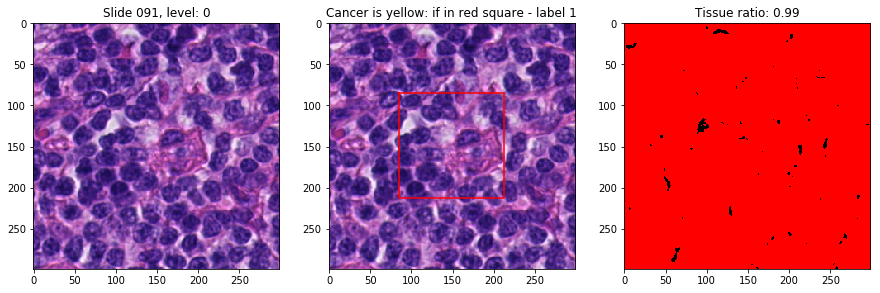

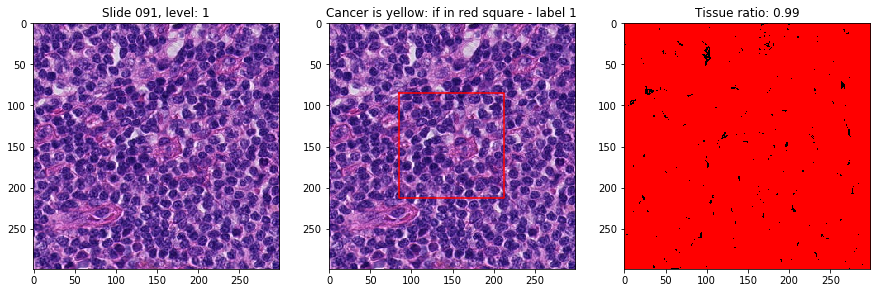

In [10]:
# define a list of images in the training and the test sets

trainval_img_list = ['016', '031', '064', '075', '078', '084', '094', '096', '101']
test_img_list = ['091']

# run patch extraction for training and test

trainval_patch_images_lev1, trainval_patch_images_lev2, trainval_patch_labels = collect_patches(trainval_img_list, lev1, lev2, 100, patch_size, patch_centre)
test_patch_images_lev1, test_patch_images_lev2, test_patch_labels = collect_patches(test_img_list, lev1, lev2, 100, patch_size, patch_centre)

In [11]:
# check saved pdf files with patch triplets
!ls -hlt *.pdf

-rw-rw-r-- 1 olahosa olahosa 311K Dec 19 15:27 multi-input_my-conv-base_lev01_lev1_patches_091_cancer-False.pdf
-rw-rw-r-- 1 olahosa olahosa 256K Dec 19 15:27 multi-input_my-conv-base_lev01_lev0_patches_091_cancer-False.pdf
-rw-rw-r-- 1 olahosa olahosa 268K Dec 19 15:27 multi-input_my-conv-base_lev01_lev1_patches_091_cancer-True.pdf
-rw-rw-r-- 1 olahosa olahosa 217K Dec 19 15:27 multi-input_my-conv-base_lev01_lev0_patches_091_cancer-True.pdf
-rw-rw-r-- 1 olahosa olahosa 297K Dec 19 15:26 multi-input_my-conv-base_lev01_lev1_patches_101_cancer-False.pdf
-rw-rw-r-- 1 olahosa olahosa 242K Dec 19 15:26 multi-input_my-conv-base_lev01_lev0_patches_101_cancer-False.pdf
-rw-rw-r-- 1 olahosa olahosa 246K Dec 19 15:26 multi-input_my-conv-base_lev01_lev1_patches_101_cancer-True.pdf
-rw-rw-r-- 1 olahosa olahosa 189K Dec 19 15:25 multi-input_my-conv-base_lev01_lev0_patches_101_cancer-True.pdf
-rw-rw-r-- 1 olahosa olahosa 289K Dec 19 15:25 multi-input_my-conv-base_lev01_lev1_patches_096_cancer-False.

# Post-process extracted patches

In [12]:
# convert images to np arrays

X1_trainval = np.asarray(trainval_patch_images_lev1)
X2_trainval = np.asarray(trainval_patch_images_lev2)
y_trainval = np.asarray(trainval_patch_labels)

X1_test = np.asarray(test_patch_images_lev1)
X2_test = np.asarray(test_patch_images_lev2)
y_test = np.asarray(test_patch_labels)

print(X1_trainval.shape, X2_trainval.shape, len(y_trainval), X1_test.shape, X2_test.shape, len(y_test))

(1800, 299, 299, 3) (1800, 299, 299, 3) 1800 (200, 299, 299, 3) (200, 299, 299, 3) 200


In [13]:
# delete unnecessary variables to save RAM
del trainval_patch_images_lev1, trainval_patch_images_lev2, trainval_patch_labels,
del test_patch_images_lev1, test_patch_images_lev2, test_patch_labels

In [14]:
# save training and testing features and target to disk

X1_trainval_filename = model_name+'_X1_trainval.npy'
X2_trainval_filename = model_name+'_X2_trainval.npy'
y_trainval_filename = model_name+'_y_trainval.npy'

X1_test_filename = model_name+'_X1_test.npy'
X2_test_filename = model_name+'_X2_test.npy'
y_test_filename = model_name+'_y_test.npy'

np.save(X1_trainval_filename, X1_trainval)
np.save(X2_trainval_filename, X2_trainval)
np.save(y_trainval_filename, y_trainval)
np.save(X1_test_filename, X1_test)
np.save(X2_test_filename, X2_test)
np.save(y_test_filename, y_test)

!ls -hlt *.npy

-rw-rw-r-- 1 olahosa olahosa  52M Dec 19 15:27 multi-input_my-conv-base_lev01_X2_test.npy
-rw-rw-r-- 1 olahosa olahosa 1.7K Dec 19 15:27 multi-input_my-conv-base_lev01_y_test.npy
-rw-rw-r-- 1 olahosa olahosa  52M Dec 19 15:27 multi-input_my-conv-base_lev01_X1_test.npy
-rw-rw-r-- 1 olahosa olahosa 461M Dec 19 15:27 multi-input_my-conv-base_lev01_X2_trainval.npy
-rw-rw-r-- 1 olahosa olahosa  15K Dec 19 15:27 multi-input_my-conv-base_lev01_y_trainval.npy
-rw-rw-r-- 1 olahosa olahosa 461M Dec 19 15:27 multi-input_my-conv-base_lev01_X1_trainval.npy


In [15]:
# # read in the training and testing features and target if they are already on Colab

# X1_trainval_filename = model_name+'_X1_trainval.npy'
# X2_trainval_filename = model_name+'_X2_trainval.npy'
# y_trainval_filename = model_name+'_y_trainval.npy'

# X1_test_filename = model_name+'_X1_test.npy'
# X2_test_filename = model_name+'_X2_test.npy'
# y_test_filename = model_name+'_y_test.npy'

# X1_trainval = np.load(X1_trainval_filename)
# X2_trainval = np.load(X2_trainval_filename)
# y_trainval = np.load(y_trainval_filename)

# X1_test = np.load(X1_test_filename)
# X2_test = np.load(X2_test_filename)
# y_test = np.load(y_test_filename)

In [16]:
print('In train/val set - patches with tumor: %d, normal patches: %d' % (np.sum(y_trainval==1), np.sum(y_trainval==0)))
print('In test set - patches with tumor: %d, normal patches: %d' % (np.sum(y_test==1), np.sum(y_test==0)))

In train/val set - patches with tumor: 900, normal patches: 900
In test set - patches with tumor: 100, normal patches: 100


In [17]:
# train/val split

X1_train, X1_val, y_train, y_val = train_test_split(X1_trainval, y_trainval, test_size=0.2, 
                                                    random_state=42, stratify=y_trainval, shuffle=True)

X2_train, X2_val, y_train, y_val = train_test_split(X2_trainval, y_trainval, test_size=0.2, 
                                                    random_state=42, stratify=y_trainval, shuffle=True)

(1440, 299, 299, 3) (360, 299, 299, 3) (200, 299, 299, 3)
# train: 1440, # val: 360, # test: 200
affected patches in train: 720, val: 180, test: 100 


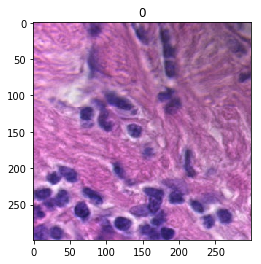

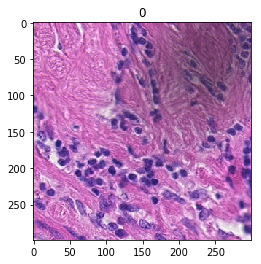

In [18]:
print(X1_train.shape, X1_val.shape, X1_test.shape)
print('# train: %d, # val: %d, # test: %d' % (len(y_train), len(y_val), len(y_test)))
print('affected patches in train: %d, val: %d, test: %d ' % (sum(y_train), sum(y_val), sum(y_test)))

plt.imshow(X1_train[100])
plt.title(y_train[100])
plt.show()

plt.imshow(X2_train[100])
plt.title(y_train[100])
plt.show()

In [19]:
# make data generators

def multiple_datagen(X1, X2, y, preprocess_input):
  """ Data generator for two inputs
  inputs:
  - X1: array, input 1 data
  - X2: array, input 2 data
  - y: array, labels
  - preprocess_input: function to pre-process data
  outputs:
  - a batch of data (generator)
  """
  
  # preprocess data
  X1 = preprocess_input(X1)
  X2 = preprocess_input(X2)
  
  while True:
      # shuffle indices    
      idx = np.random.permutation(X1.shape[0])
      # create image generator
      datagen = ImageDataGenerator()

      # get batches with the defied indices
      batches = datagen.flow(X1[idx], y[idx], batch_size=32)
      idx0 = 0
      for batch in batches:
          idx1 = idx0 + batch[0].shape[0]

          # yield batch with input2 with the same indexes as input 1 and target
          yield [batch[0], X2[idx[idx0:idx1]]], batch[1]

          idx0 = idx1
          if idx1 >= X1.shape[0]:
              break

def rescale11(x):
    """Rescale RBG values to [-1, 1]
    """
    
    x = x.astype(float)
    x /= 255.
    x -= 0.5
    x *= 2.
    return x
  
def rescale01(x):
    """Rescale RBG values to [0, 1]
    """
    
    x = x.astype(float)
    x /= 255.
    return x

if my_pre_process == 'rescale_0-1':
  preprocess_input = rescale01
if my_pre_process == 'rescale_-1-1':
  preprocess_input = rescale11
      
# make datagens for train, val, test
train_generator = multiple_datagen(X1_train, X2_train, y_train, preprocess_input)
val_generator = multiple_datagen(X1_val, X2_val, y_val, preprocess_input)
test_generator = multiple_datagen(X1_test, X2_test, y_test, preprocess_input)

# Model definition

## Inception V3 convolutional base

In [20]:
if my_conv_base == 'Inception':
    # conv tower for input 1
    conv1 = InceptionV3(weights='imagenet', include_top=False, input_shape=(patch_size, patch_size, 3))
    in1 = conv1.input
    out1 = conv1.output

    # conv tower for input 2
    conv2 = InceptionV3(weights='imagenet', include_top=False, input_shape=(patch_size, patch_size, 3))

    # rename layers to avoid name collisions
    for layer in conv2.layers:
        layer.name = layer.name + str("_2")

    in2 = conv2.input
    out2 = conv2.output

    # merge conv outputs
    merged = concatenate([out1, out2])
    
    # fully connected top layers
    flat = Flatten()(merged)
    dense1 = Dense(256, activation='relu')(flat)
    drop1 = Dropout(.5)(dense1)
    final_out = Dense(1, activation='sigmoid')(drop1)

    # call model
    model = Model([in1, in2], final_out)
    
    print('Number of trainable layers in the model:', len(model.trainable_weights))

## Concolutional base defined by me

In [21]:
if my_conv_base == 'my-conv-base':

    # conv tower for input 1
    conv1 = Sequential([
        Conv2D(32, kernel_size=(5, 5), input_shape=(patch_size, patch_size, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, kernel_size=(3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, kernel_size=(3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(128, kernel_size=(3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2))
    ])
    in1 = conv1.input
    out1 = conv1.output
    
    # conv tower for input 2
    conv2 = Sequential([
        Conv2D(32, kernel_size=(5, 5), input_shape=(patch_size, patch_size, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, kernel_size=(3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, kernel_size=(3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(128, kernel_size=(3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2))
    ])
    
    # rename layers to avoid name collisions
    for layer in conv2.layers:
        layer.name = layer.name + str("_2")

    in2 = conv2.input
    out2 = conv2.output

    # merge conv outputs
    merged = concatenate([out1, out2])
    
    # fully connected top layers
    flat = Flatten()(merged)
    dense1 = Dense(256, activation='relu')(flat)
    drop1 = Dropout(.5)(dense1)
    final_out = Dense(1, activation='sigmoid')(drop1)

    # call model
    model = Model([in1, in2], final_out)
    
    model.summary()
    
    print('Number of trainable layers in the model:', len(model.trainable_weights))

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
conv2d_1_input (InputLayer)     (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_5_input (InputLayer)     (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 299, 299, 32) 2432        conv2d_1_input[0][0]             
__________________________________________________________________________________________________
conv2d_5_2 (Conv2D)             (None, 299, 299, 32) 2432        conv2d_5_input[0][0]             
__________________________________________________________________________________________________
batch_norm

# Model execution

In [22]:
# compile model

model.compile(optimizer=RMSprop(lr=1e-5),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

In [23]:
# use early stopping
early_stopping = EarlyStopping(monitor='val_loss',
                               min_delta=0.001,
                               patience=3,
                               verbose=1)

# save checkpoints (in case GCC crashes mid-training)
save_model = ModelCheckpoint('weights.{epoch:02d}-{val_loss:.2f}.hdf5')


# time model run
start_time = time.time()/60
history = model.fit_generator(
    train_generator,
    steps_per_epoch=32*9,
    epochs=50,
    validation_data=val_generator,
    validation_steps=32*3,
    callbacks=[early_stopping, save_model])
train_time = time.time()/60 - start_time
print('Time: %.2f min' % train_time)


# save model to disk
model_filename = model_name + '_MODEL.h5' 
model.save(model_filename)

# check if model is there
!ls -hlt *.h5

Epoch 1/50
288/288 [==============================] - 2576s 9s/step - loss: 0.5862 - acc: 0.7121 - val_loss: 0.5894 - val_acc: 0.6806
Epoch 2/50
288/288 [==============================] - 2574s 9s/step - loss: 0.3795 - acc: 0.8305 - val_loss: 0.2745 - val_acc: 0.8750
Epoch 3/50
288/288 [==============================] - 2578s 9s/step - loss: 0.2873 - acc: 0.8799 - val_loss: 0.2635 - val_acc: 0.8750
Epoch 4/50
288/288 [==============================] - 2581s 9s/step - loss: 0.2420 - acc: 0.9009 - val_loss: 0.2602 - val_acc: 0.8788
Epoch 5/50
288/288 [==============================] - 2600s 9s/step - loss: 0.1979 - acc: 0.9220 - val_loss: 0.3615 - val_acc: 0.8632
Epoch 6/50
288/288 [==============================] - 2596s 9s/step - loss: 0.1584 - acc: 0.9351 - val_loss: 0.2495 - val_acc: 0.9094
Epoch 7/50
288/288 [==============================] - 2610s 9s/step - loss: 0.1242 - acc: 0.9502 - val_loss: 0.2857 - val_acc: 0.8729
Epoch 8/50
288/288 [==============================] - 2590s 9s

In [24]:
def plot_history(histories, key=['acc', 'loss']):
    """ plot model training history
    """
    
    fig, axes = plt.subplots(1,2, figsize=(15, 5))
    
    for i, ax_key in enumerate(key): 
        ax = axes[i]
        ax_key = key[i]
        
        for name, history in histories:
            
            val = ax.plot(history.epoch, history.history['val_'+ax_key], '--', label=name.title()+' Val')
            ax.plot(history.epoch, history.history[ax_key], color=val[0].get_color(), label=name.title()+' Train')

        ax.set_xlabel('Epochs')
        ax.set_ylabel(ax_key.replace('_',' ').title())
        
        if ax_key=='acc': 
            ax.legend()
        else: 
            ax.legend(loc=1)
        
    plt.title('Training time: %.2f min' % train_time)
    
    plt.show()
    
    fig.savefig(model_name+'_training-history.pdf', bbox_inches='tight')

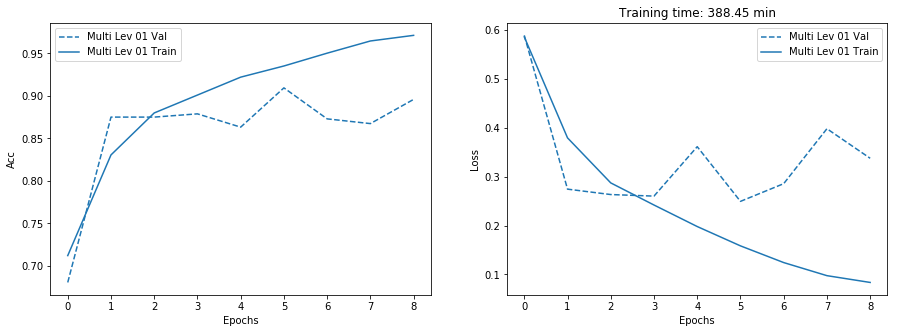

In [25]:
plot_history([('multi lev ' + str(lev1) + str(lev2), history)])

In [34]:
# load model if it's already saved on disk

model_filename = model_name + '_MODEL.h5' 
model = load_model(model_filename)

In [35]:
# delete unnecessary variables to save memory
del X1_train, X1_val, X2_train, X2_val, y_train, y_val

NameError: name 'X1_train' is not defined

# Evaluate model on test set from unseen slides

In [36]:
# accuracy on the test set (balanced)

start_time = time.time()/60
test_loss, test_acc = model.evaluate_generator(test_generator, steps=32*3)
print('Time: %.2f min' % (time.time()/60 - start_time))

print('Test loss: %.4f, accuracy: %.4f' % (test_loss, test_acc))

Time: 2.65 min
Test loss: 0.1495, accuracy: 0.9375


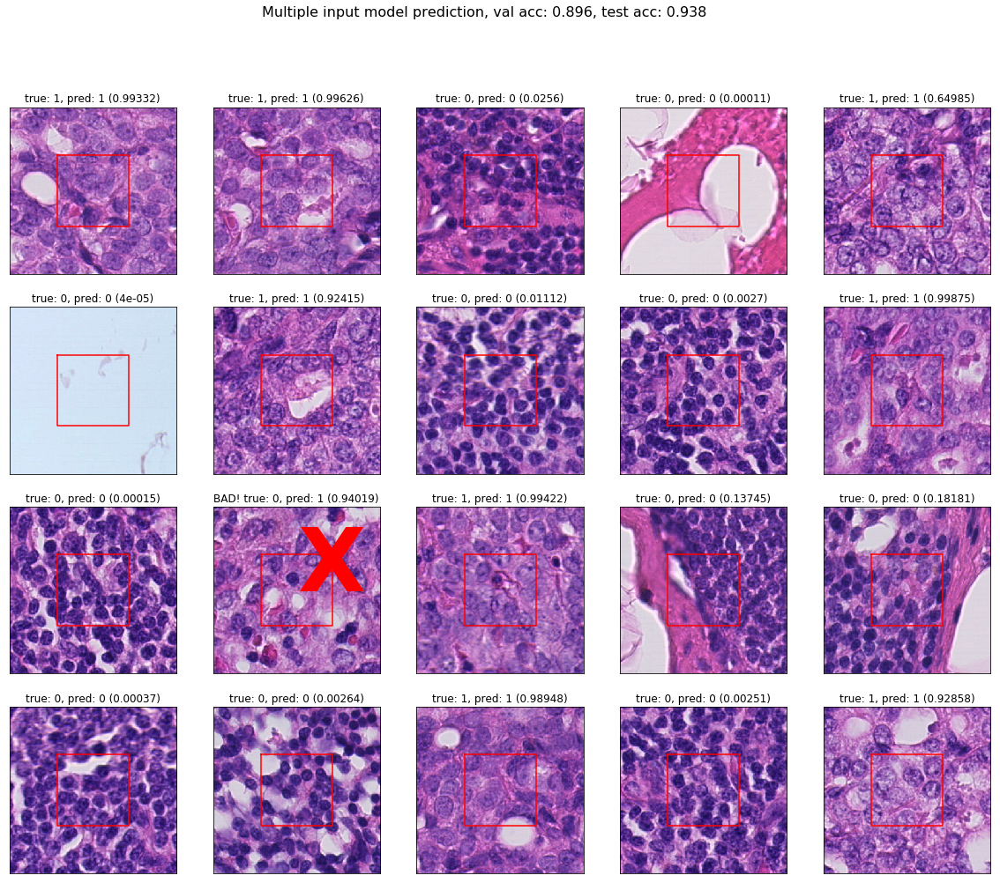

In [37]:
# visually check some predictions for examples from the test set (slides unseen in training)


# get a batch from the test set
vis_examples = next(test_generator)

# get images, labels and predictions for that batch
vis_img = vis_examples[0]
vis_lab = vis_examples[1]

# make a prediction for that batch
vis_pred = model.predict([vis_img[0], vis_img[1]])

offset = int((patch_size-patch_centre)/2)

bad_font = {'weight' : 'bold', 
            'size'   : 100}

# plot n examples
n = 20
fig, axes = plt.subplots(4,5, figsize=(20, 16))
axes = axes.ravel()

for i in range(n):
    a = axes[i]
        
    # convert the array to image format
    img = array_to_img(vis_img[0][i].reshape(patch_size,patch_size,3))
    a.imshow(img)
    
    # plot the 128x128 central square
    a.plot([offset, offset+patch_centre, offset+patch_centre, offset, offset],
           [offset, offset, offset+patch_centre, offset+patch_centre, offset], 'r')

    # remove tick labels
    a.set_xticks([]), a.set_yticks([])
    a.set_yticklabels([]), a.set_xticklabels([])
    
    # get ith predicted class
    pred_prob = vis_pred[i][0]
    pred_class = int(pred_prob>=0.5)
    
    # put details in titles
    # put a big red 'X' on misclassified images
    if vis_lab[i]==pred_class:
        a.set_title('true: '+ str(vis_lab[i])+', pred: '+str(pred_class) + ' (' + str(round(pred_prob,5)) + ')')
    else:
        a.set_title('BAD! true: '+ str(vis_lab[i])+', pred: '+str(pred_class) + ' (' + str(round(pred_prob,5)) + ')')
        a.text(150, 150, 'X', color='r', **bad_font)
        
fig.suptitle('Multiple input model prediction, val acc: %.3f, test acc: %.3f' % 
             (history.history['val_acc'][-1], test_acc), fontsize=16)
        
plt.show()

fig.savefig(model_name+'_pred_test_mosaic.pdf', bbox_inches='tight')

# Heatmap generation

In [38]:
# delete unnecessary variables to save memory
del X1_test, X2_test, y_test

NameError: name 'X1_test' is not defined

In [39]:
def get_patches_predict(slide, tumor_mask, lev, x0, y0, patch_size):
    """ Get patches from a slide: RBG image, tumor mask, tissue mask CENTERED at x0, y0
    imputs:
    - slide: OpenSlide object for RGB slide images
    - tumor_mask: OpenSlide object for tumor masks
    - lev: int, target zoom level for the patches, between 0 and 7
    - x0, y0: int, pixel coordinates at level 0
    - patch_size: int, usually 299
    outputs:
    - patch_image: array, RBG image
    - patch_mask: array, tumor mask
    - patch_tissue: array, tissue mask
    """
    
    # calc downsample factor
    downsample_factor = 2**lev
    
    # read RGB patch
    patch_image = read_slide(slide,
                             x = x0-(patch_size//2)*downsample_factor,
                             y = y0-(patch_size//2)*downsample_factor, 
                             level = lev,
                             width = patch_size,
                             height = patch_size)
    
    # read tumor mask
    patch_mask = read_slide(tumor_mask,
                            x = x0-(patch_size//2)*downsample_factor,
                            y = y0-(patch_size//2)*downsample_factor, 
                            level = lev,
                            width = patch_size,
                            height = patch_size)

    # 1 channel is enough for the mask
    patch_mask = patch_mask[:,:,0]
    
    return patch_image, patch_mask

In [40]:
def get_heatmap(f_num, lev1, lev2, patch_size, patch_centre):
  """ Generate a heatmap at level 7 by sliding a window in x and y in and extracting 
  patches at the model zoom level for every pixel at level 7

  inputs:
  - f_num: str, slide number
  - lev1: int, target zoom level for the patches, between 0 and 7 - higher resolution: lev1<lev2
  - lev2: int, target zoom level for the patches, between 0 and 7 - lower resolution
  - patch_size: int, usually 299
  - patch_centre: int, usually 128

  outputs:
  - heatmap: array of floats, heatmap at level 7
  - max_heatmap: maximum of the heatmap
  outputs: evaluation scores for imbalanced classification (from sklearn.metric):
  - precision: float in [0, 1]
  - recall: float in [0, 1]
  - f1: float in [0, 1]
  - roc_auc: float in [0, 1]
  - avg_prec: float in [0, 1]
  - save a plot of the heatmap
  """
    
  # ---------------------------------------------------------------------------
  # get the slide at level 7 and plot it

  # file paths
  slide_path = 'slides/tumor_'+f_num+'.tif'
  tumor_mask_path = 'slides/tumor_'+f_num+'_mask.tif'

  print(slide_path, tumor_mask_path)

  # get slide objects with OpenSlide
  slide = open_slide(slide_path)
  tumor_mask = open_slide(tumor_mask_path)

  # read level 7 RBG image
  slide_image_lev7 = read_slide(slide, 
                           x=0, 
                           y=0, 
                           level=7, 
                           width=slide.level_dimensions[7][0], 
                           height=slide.level_dimensions[7][1])

  # read level 7 tumor mask
  mask_image_lev7 = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=7, 
                          width=tumor_mask.level_dimensions[7][0], 
                          height=tumor_mask.level_dimensions[7][1])

  mask_image_lev7 = mask_image_lev7[:,:,0]

  # get tissue mask
  tissue_pixels_lev7 = find_tissue_pixels(slide_image_lev7)
  tissue_regions_lev7 = apply_mask(slide_image_lev7, tissue_pixels_lev7)

  # plot images and masks
  fig, axes = plt.subplots(1,3, figsize=(20,10), dpi=100)
  axes[0].imshow(slide_image_lev7)
  axes[1].imshow(mask_image_lev7)
  axes[2].imshow(tissue_regions_lev7)
  plt.show()
    
    
  # ---------------------------------------------------------------------------
  # slide through the image and fill in the heatmap

  start_time = time.time()/60

  # init the heatmap with zeros (size of level 7)
  heatmap = np.zeros(slide_image_lev7.shape[:2])

  true_class, pred_class = [], []

  # stride at level 7
  stride = 2**lev1

  # offset for correctly setting the values in heatmap
  heatmap_offset = stride//2


  heat_x = []
  heat_y = []

  # collect a batches of 1000 patches and make a prediction on that batch (done to speed up)
  # for each zoom level
  strip_of_patches_lev1, strip_of_patches_lev2 = [], []

  print(slide.level_dimensions[7][0], slide.level_dimensions[7][1])

  # slide in x by stride 
  for x in range(stride*2, slide.level_dimensions[7][1]-3*stride, stride):

    if x%(10*stride)==0:
      print('|', x, end=': ')
      if x%(10*10*stride)==0:
        print()

    # slide in y by stride 
    for y in range(stride*2, slide.level_dimensions[7][0]-3*stride, stride):

      # convert level 7 coordinates to level 0
      x0 = x*(2**7)
      y0 = y*(2**7)

      # only do prediction if the pixel at level 7 is a tissie (i.e. >0.8 greyscale)
      if tissue_regions_lev7[x, y, 0]==1:

        # keep level 7 coordinates
        heat_x.append(x)
        heat_y.append(y)

        # get patch CENTERED at x0, y0
        patch_image_lev1, patch_mask_lev1 = get_patches_predict(slide, tumor_mask, lev1, y0, x0, patch_size)
        # append to the batch of patches
        strip_of_patches_lev1.append(patch_image_lev1)

        # get true label
        has_cancer = check_patch_centre(patch_mask_lev1, patch_centre)
        true_class.append(has_cancer)

        patch_image_lev2, patch_mask_lev2 = get_patches_predict(slide, tumor_mask, lev2, x0, y0, patch_size)
        strip_of_patches_lev2.append(patch_image_lev2)

        # if 1000 patches collected, make a prediction for them and append the precictions
        if len(strip_of_patches_lev1)==1000:
          X1 = preprocess_input(np.asarray(strip_of_patches_lev1))
          X2 = preprocess_input(np.asarray(strip_of_patches_lev2))
          print(X1.shape[0], end=' ')
          my_pred = model.predict([X1, X2])

          pred_class.extend(my_pred)

          # reset strips of patches
          strip_of_patches_lev1 = []
          strip_of_patches_lev2 = []

  # make a prediction for remaining patches (last strip with num patches <1000)
  X1 = preprocess_input(np.asarray(strip_of_patches_lev1))
  X2 = preprocess_input(np.asarray(strip_of_patches_lev2))
  print(X1.shape[0], end=' ')
  my_pred = model.predict([X1, X2])

  pred_class.extend(my_pred)

  # fill in the patch in heatmap with predicted values
  # use saved level 7 x and y coordinates and saved predictions
  if lev1==0:
    # if model level was 0 - fill only one pixel in the heatmap
    for i in range(len(pred_class)):
      heatmap[heat_x[i], heat_y[i]] = pred_class[i]
  else:
    # if mode level > 0 - fill an appropriate patch
    for i in range(len(pred_class)):
      heatmap[heat_x[i]-heatmap_offset:heat_x[i]+heatmap_offset, heat_y[i]-heatmap_offset:heat_y[i]+heatmap_offset] = pred_class[i]
    
  heat_time = time.time()/60 - start_time
    
  # ---------------------------------------------------------------------------
  # print evaluation metrics

  # get max of heatmap to report
  max_heatmap = np.max(heatmap)

  print()
  print('Heatmap max: %.3f' % max_heatmap)
  print()

  # calc roc auc score and average precision on predicted probabilities (float in [0, 1])
  roc_auc = roc_auc_score(np.array(true_class) == 1, pred_class)
  avg_prec = average_precision_score(np.array(true_class) == 1, pred_class)

  # calc other scores on the predicted labels (0 or 1)
  precision = precision_score(np.array(true_class) == 1, np.array(pred_class) >= 0.5)
  recall = recall_score(np.array(true_class) == 1, np.array(pred_class) >= 0.5)
  f1 = f1_score(np.array(true_class) == 1, np.array(pred_class) >= 0.5)

  print('Precision score: %.3f' % precision)
  print('Recall score: %.3f' % recall)
  print('F1 score: %.3f' % f1)
  print('ROC AUC score: %.3f' % roc_auc)
  print('Average precision score: %.3f' % avg_prec)


  # ---------------------------------------------------------------------------
  # plot figure with heatmap overlaid

  fig, axes = plt.subplots(1,2, figsize=(20,20), dpi=100)
    
  cmap = plt.cm.viridis

  # normalize the mask between 0 and 1
  v_min, v_max = 0, 1
  colors = Normalize(v_min, v_max)(mask_image_lev7)
  colors = cmap(colors)
  # add transparency layer equal to the image: low values are translarent,
  # high values are more opaque
  colors[..., -1] = mask_image_lev7/np.max(mask_image_lev7)

  # image in RGB with tumor mask overlay (viridis) - cancer is yellow
  a = axes[0]
  a.imshow(slide_image_lev7)
  a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.8)
  a.set_xticks([]), axes[0].set_yticks([])
  a.set_title('TRUE (tumor as labeled by a pathologist), slide num: ' + f_num)

    
  a = axes[1]

  # normalize the mask between 0 and 1
  v_min, v_max = 0, 1
  colors = Normalize(v_min, v_max)(heatmap)
  colors = cmap(colors)
  # add transparency layer equal to the image: low values are translarent,
  # high values are more opaque
  colors[..., -1] = heatmap/np.max(heatmap)

  # image in RGB with HEATMAP overlay (viridis) - cancer is yellow
  a.imshow(slide_image_lev7)
  a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.8)
  a.set_xticks([]), axes[1].set_yticks([])
  a.set_title('PRED (mult model lev %d - %d), slide num: %s | max: %.2f,  prec: %.2f, rec: %.2f, f1: %.2f, , roc auc: %.2f, avg prec: %.2f, time: %.2f' %
              (lev1, lev2, f_num, max_heatmap,  precision, recall, f1, roc_auc, avg_prec, heat_time))

  plt.show()

  fig.savefig(model_name+'_pred_'+f_num+'.pdf', bbox_inches='tight')
  
  return heatmap, max_heatmap, precision, recall, f1, roc_auc, avg_prec

slides/tumor_091.tif slides/tumor_091_mask.tif


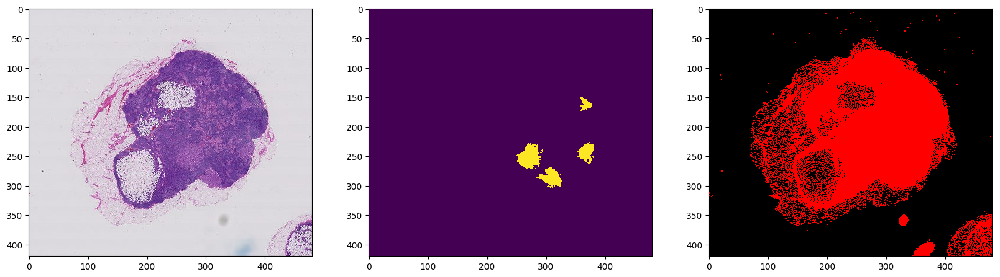

480 420
| 10: | 20: | 30: | 40: | 50: | 60: | 70: 1000 | 80: 1000 | 90: 1000 | 100: 
1000 1000 | 110: 1000 1000 | 120: 1000 1000 | 130: 1000 1000 | 140: 1000 1000 1000 | 150: 1000 1000 | 160: 1000 1000 1000 | 170: 1000 1000 1000 | 180: 1000 1000 | 190: 1000 1000 1000 | 200: 
1000 1000 1000 | 210: 1000 1000 1000 | 220: 1000 1000 1000 | 230: 1000 1000 | 240: 1000 1000 1000 | 250: 1000 1000 1000 | 260: 1000 1000 | 270: 1000 1000 | 280: 1000 1000 | 290: 1000 1000 | 300: 
1000 1000 | 310: 1000 | 320: 1000 1000 | 330: 1000 | 340: | 350: 1000 | 360: | 370: 1000 | 380: | 390: 1000 | 400: 
| 410: 1000 196 
Heatmap max: 1.000

Precision score: 0.394
Recall score: 0.844
F1 score: 0.537
ROC AUC score: 0.959
Average precision score: 0.740


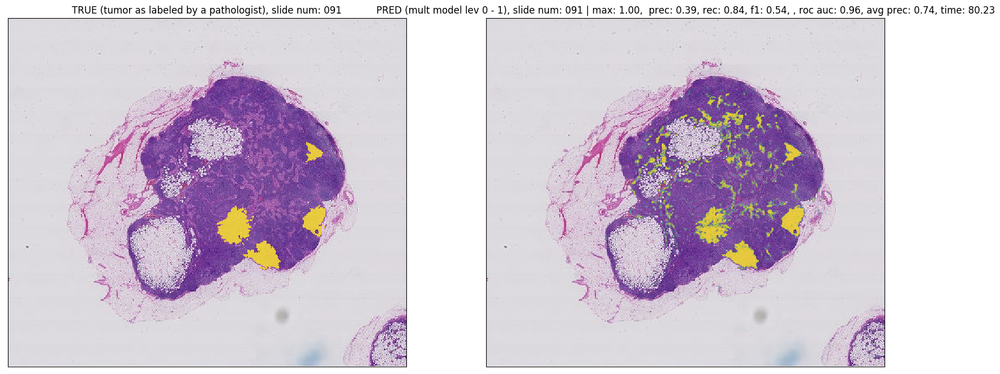

slides/tumor_110.tif slides/tumor_110_mask.tif


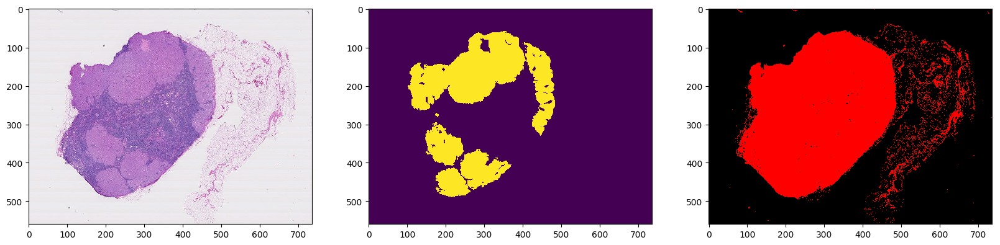

736 560
| 10: | 20: | 30: | 40: | 50: | 60: 1000 | 70: 1000 | 80: 1000 1000 | 90: 1000 1000 | 100: 
1000 1000 | 110: 1000 1000 1000 | 120: 1000 1000 1000 | 130: 1000 1000 1000 | 140: 1000 1000 1000 | 150: 1000 1000 1000 1000 1000 | 160: 1000 1000 1000 1000 | 170: 1000 1000 1000 1000 | 180: 1000 1000 1000 1000 | 190: 1000 1000 1000 1000 | 200: 
1000 1000 1000 1000 | 210: 1000 1000 1000 1000 1000 | 220: 1000 1000 1000 1000 | 230: 1000 1000 1000 1000 | 240: 1000 1000 1000 1000 | 250: 1000 1000 1000 1000 | 260: 1000 1000 1000 1000 | 270: 1000 1000 1000 1000 | 280: 1000 1000 1000 1000 | 290: 1000 1000 1000 1000 | 300: 
1000 1000 1000 1000 | 310: 1000 1000 1000 1000 | 320: 1000 1000 1000 1000 | 330: 1000 1000 1000 | 340: 1000 1000 1000 1000 | 350: 1000 1000 1000 1000 | 360: 1000 1000 1000 1000 | 370: 1000 1000 1000 | 380: 1000 1000 1000 | 390: 1000 1000 1000 | 400: 
1000 1000 1000 | 410: 1000 1000 1000 | 420: 1000 1000 1000 | 430: 1000 1000 | 440: 1000 1000 | 450: 1000 1000 | 460: 1000 | 470

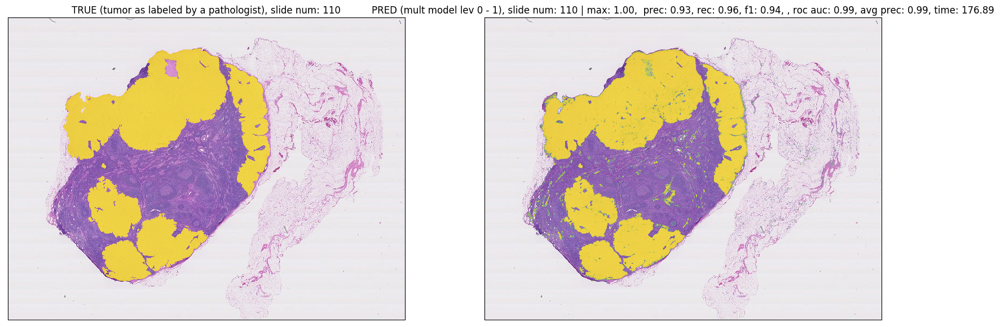

slides/tumor_031.tif slides/tumor_031_mask.tif


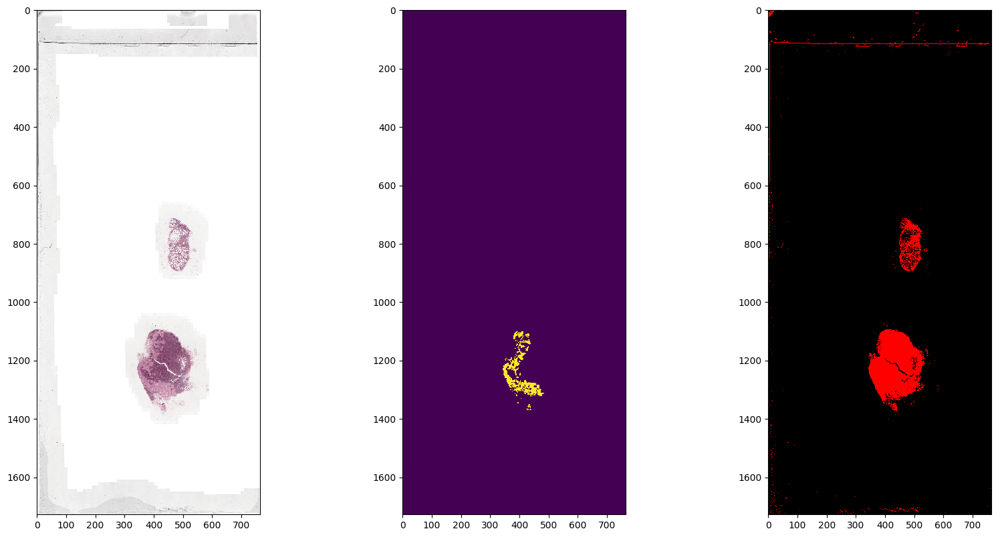

764 1728
| 10: | 20: | 30: | 40: | 50: | 60: | 70: | 80: | 90: | 100: 
| 110: 1000 1000 | 120: 1000 | 130: | 140: | 150: | 160: | 170: | 180: | 190: | 200: 
| 210: | 220: | 230: | 240: | 250: | 260: | 270: | 280: | 290: | 300: 
| 310: | 320: | 330: | 340: | 350: | 360: | 370: | 380: | 390: | 400: 
| 410: | 420: | 430: | 440: | 450: | 460: | 470: | 480: | 490: | 500: 
| 510: | 520: | 530: 1000 | 540: | 550: | 560: | 570: | 580: | 590: | 600: 
| 610: | 620: | 630: | 640: | 650: | 660: | 670: | 680: | 690: | 700: 
| 710: | 720: | 730: 1000 | 740: | 750: 1000 | 760: | 770: | 780: 1000 | 790: | 800: 
1000 | 810: 1000 | 820: | 830: 1000 | 840: | 850: 1000 | 860: | 870: | 880: 1000 | 890: | 900: 
| 910: | 920: | 930: | 940: | 950: | 960: | 970: | 980: | 990: | 1000: 
| 1010: | 1020: | 1030: | 1040: | 1050: | 1060: | 1070: | 1080: | 1090: | 1100: 
1000 | 1110: 1000 | 1120: 1000 | 1130: 1000 | 1140: 1000 | 1150: 1000 1000 | 1160: 1000 | 1170: 1000 1000 | 1180: 1000 | 1190: 1000 1000 | 1200: 
10

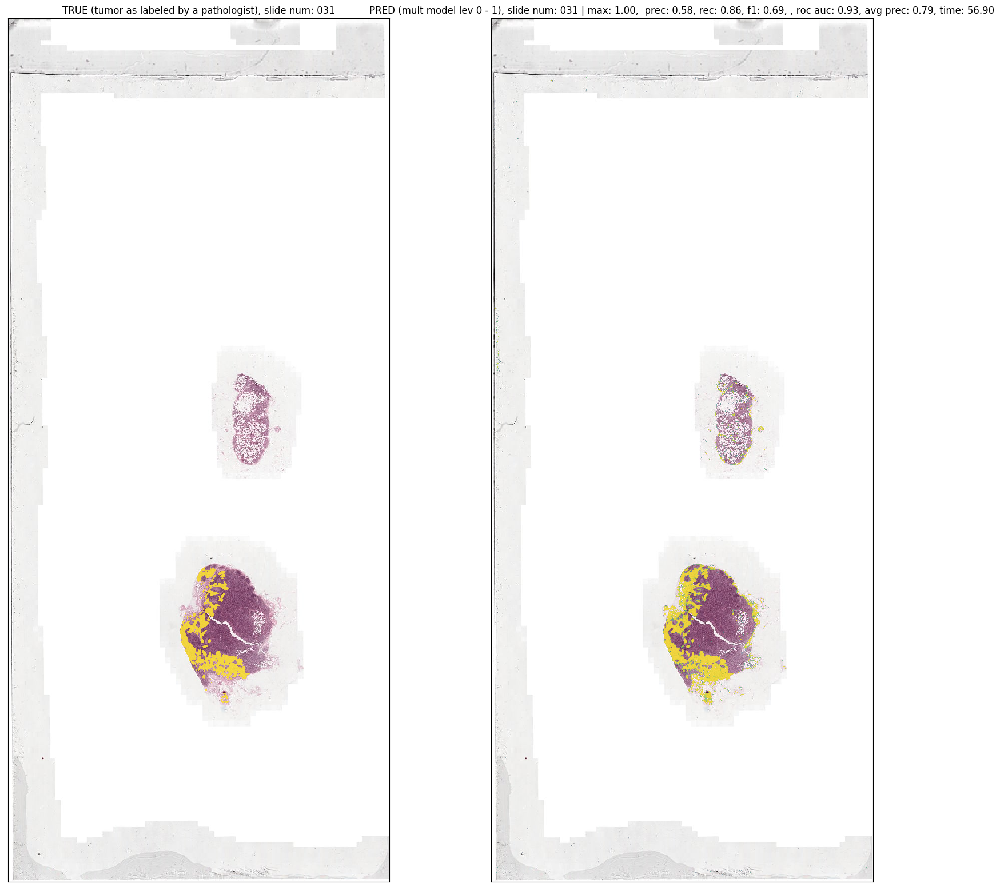

In [41]:
# train/val set: ['016', '031', '064', '075', 078', '084', 094', '096', '101']:
# test slide: '091'
# slide not exhaustively annotated: '110'

# generate a heatmap for:
# '091' - test slide
# '110' - non-exhaustively annotated slide
# '031' - slide from the training set

slides_to_heatmap = ['091', '110', '031']
# slides_to_heatmap = ['031']

for f_num in slides_to_heatmap:
  heatmap, max_heatmap, precision, recall, f1, roc_auc, avg_prec = get_heatmap(f_num, lev1, lev2, patch_size, patch_centre)